# Data Science Machine Test - Tranzmeo IT Solutions Pvt. Ltd.

# Analysis of NOAA Temperature Data (2005-2015)

This notebook analyzes temperature data near Ann Arbor, Michigan, from 2005 to 2015. It visualizes record high and low temperatures, identifies record-breaking temperatures in 2015, and maps the stations involved in the data collection.


# Install modules

In [ ]:
!pip install pandas

In [ ]:
pip install pip --upgrade

In [ ]:
pip --version

In [ ]:
import pandas as pd

In [5]:
!pip install ipykernel

In [13]:
!pip install matplotlib

   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ------ --------------------------------- 1.3/7.8 MB 7.5 MB/s eta 0:00:01
   -------------- ------------------------- 2.9/7.8 MB 7.3 MB/s eta 0:00:01
   -------------------- ------------------- 3.9/7.8 MB 6.9 MB/s eta 0:00:01
   ---------------------------- ----------- 5.5/7.8 MB 6.5 MB/s eta 0:00:01
   --------------------------------- ------ 6.6/7.8 MB 6.3 MB/s eta 0:00:01
   ------------------------------------ --- 7.1/7.8 MB 5.6 MB/s eta 0:00:01
   -------------------------------------- - 7.6/7.8 MB 5.2 MB/s eta 0:00:01
   ---------------------------------------- 7.8/7.8 MB 5.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   --------- ------------------------------ 0.5/2.2 MB 3.4 MB/s eta 0:00:01
   ------------------ --------------------- 1.0/2.2 MB 3.4 MB/s eta 0:00:01
   --------------------------------- ------ 1.8/2.2 MB 3.1 MB/s eta 0:00:01
   -----------------------

# Load and Inspect the Dataset

In [12]:
import pandas as pd

# Load the dataset
temperature_df = pd.read_csv('temperature (1) (1) (1).csv')  # Replace with your actual file name

# Display the first few rows
print("First five rows of the dataset:")
print(temperature_df.head())

# Display column names
print("\nColumn names in the dataset:")
print(temperature_df.columns)


First five rows of the dataset:
            ID        Date Element  Data_Value
0  USW00094889  2014-11-12    TMAX          22
1  USC00208972  2009-04-29    TMIN          56
2  USC00200032  2008-05-26    TMAX         278
3  USC00205563  2005-11-11    TMAX         139
4  USC00200230  2014-02-27    TMAX        -106

Column names in the dataset:
Index(['ID', 'Date', 'Element', 'Data_Value'], dtype='object')


# Dataset after removing invalid dates

In [13]:
# Parse the 'Date' column as datetime, specifying dayfirst=True
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'], format='%d-%m-%Y', errors='coerce')

# Check for any parsing issues
invalid_dates = temperature_df[temperature_df['Date'].isna()]
print("\nNumber of invalid date entries:", len(invalid_dates))

# If there are invalid dates, inspect them
if len(invalid_dates) > 0:
    print("\nInvalid date entries:")
    print(invalid_dates.head())



Number of invalid date entries: 165085

Invalid date entries:
            ID Date Element  Data_Value
0  USW00094889  NaT    TMAX          22
1  USC00208972  NaT    TMIN          56
2  USC00200032  NaT    TMAX         278
3  USC00205563  NaT    TMAX         139
4  USC00200230  NaT    TMAX        -106


In [15]:
# Remove rows with invalid dates
temperature_df = temperature_df.dropna(subset=['Date'])

# Verify the removal
print("\nDataset size after removing invalid dates:", temperature_df.shape)



Dataset size after removing invalid dates: (165085, 4)


# Parse the 'Date' Column Correctly and Create 'year' and 'day_of_year' Columns

In [19]:
# Parse the 'Date' column as datetime (since it's already in 'YYYY-MM-DD' format)
temperature_df['Date'] = pd.to_datetime(temperature_df['Date'], format='%Y-%m-%d')

# Extract the 'year' and create the 'day_of_year' column (in 'MM-DD' format)
temperature_df['year'] = temperature_df['Date'].dt.year
temperature_df['day_of_year'] = temperature_df['Date'].dt.strftime('%m-%d')

# Check the updated DataFrame with the new 'year' and 'day_of_year' columns
print("\nDataset with 'year' and 'day_of_year' columns:")
print(temperature_df[['Date', 'year', 'day_of_year']].head())

# Display the DataFrame after parsing and cleaning
print("\nCleaned dataset:")
print(temperature_df.head())


Dataset with 'year' and 'day_of_year' columns:
        Date  year day_of_year
0 2014-11-12  2014       11-12
1 2009-04-29  2009       04-29
2 2008-05-26  2008       05-26
3 2005-11-11  2005       11-11
4 2014-02-27  2014       02-27

Cleaned dataset:
            ID       Date Element  Data_Value  year day_of_year
0  USW00094889 2014-11-12    TMAX          22  2014       11-12
1  USC00208972 2009-04-29    TMIN          56  2009       04-29
2  USC00200032 2008-05-26    TMAX         278  2008       05-26
3  USC00205563 2005-11-11    TMAX         139  2005       11-11
4  USC00200230 2014-02-27    TMAX        -106  2014       02-27


 # Remove Leap Days (February 29th)

In [20]:
# Remove February 29th entries
temperature_df = temperature_df[~((temperature_df['Date'].dt.month == 2) & (temperature_df['Date'].dt.day == 29))]

# Verify the removal
print("\nDataset size after removing leap days:", temperature_df.shape)



Dataset size after removing leap days: (165002, 6)


# Filter Data for Years 2005-2014

In [21]:
# Filter for years 2005 to 2014
df_2005_2014 = temperature_df[(temperature_df['year'] >= 2005) & (temperature_df['year'] <= 2014)]

# Verify the filtering
print("\nDataset size for 2005-2014:", df_2005_2014.shape)
print("Available years in the filtered dataset:", df_2005_2014['year'].unique())



Dataset size for 2005-2014: (151245, 6)
Available years in the filtered dataset: [2014 2009 2008 2005 2010 2007 2011 2013 2006 2012]


# Separate TMAX and TMIN Values

In [22]:
# Separate TMAX and TMIN
tmax_df = df_2005_2014[df_2005_2014['Element'] == 'TMAX']
tmin_df = df_2005_2014[df_2005_2014['Element'] == 'TMIN']

# Check the separated DataFrames
print("\nNumber of TMAX records:", tmax_df.shape[0])
print("Number of TMIN records:", tmin_df.shape[0])



Number of TMAX records: 76100
Number of TMIN records: 75145


In [23]:
# Find the record high (max TMAX) for each day
record_highs = tmax_df.groupby('day_of_year')['Data_Value'].max() / 10  # Convert to degrees Celsius

# Find the record low (min TMIN) for each day
record_lows = tmin_df.groupby('day_of_year')['Data_Value'].min() / 10   # Convert to degrees Celsius

# Display the first few records
print("\nRecord Highs (first five days):")
print(record_highs.head())

print("\nRecord Lows (first five days):")
print(record_lows.head())



Record Highs (first five days):
day_of_year
01-01    15.6
01-02    13.9
01-03    13.3
01-04    10.6
01-05    12.8
Name: Data_Value, dtype: float64

Record Lows (first five days):
day_of_year
01-01   -16.0
01-02   -26.7
01-03   -26.7
01-04   -26.1
01-05   -15.0
Name: Data_Value, dtype: float64


# Plot the Record Highs and Lows with Shaded Area

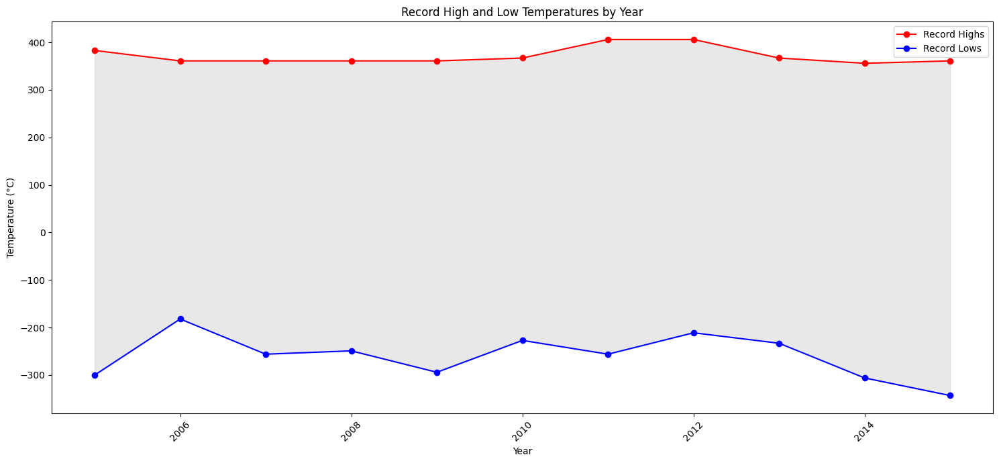

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

# Group the data by year and find the max (record high) and min (record low) for each year
annual_highs = temperature_df[temperature_df['Element'] == 'TMAX'].groupby('year')['Data_Value'].max()
annual_lows = temperature_df[temperature_df['Element'] == 'TMIN'].groupby('year')['Data_Value'].min()

# Create a figure and axis for the plot
plt.figure(figsize=(15, 7))

# Plot record highs by year
plt.plot(annual_highs.index, annual_highs.values, label='Record Highs', color='red', marker='o')

# Plot record lows by year
plt.plot(annual_lows.index, annual_lows.values, label='Record Lows', color='blue', marker='o')

# Shade the area between the record highs and lows
plt.fill_between(annual_highs.index, annual_lows.values, annual_highs.values, color='lightgray', alpha=0.5)

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Record High and Low Temperatures by Year')

# Add legend
plt.legend(loc='best')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent clipping
plt.tight_layout()

# Display the plot
plt.show()


In [26]:
# Filter for the year 2015
df_2015 = temperature_df[temperature_df['year'] == 2015]

# Separate TMAX and TMIN for 2015
tmax_2015 = df_2015[df_2015['Element'] == 'TMAX']
tmin_2015 = df_2015[df_2015['Element'] == 'TMIN']

# Check the separated DataFrames
print("\nNumber of TMAX records in 2015:", tmax_2015.shape[0])
print("Number of TMIN records in 2015:", tmin_2015.shape[0])



Number of TMAX records in 2015: 6920
Number of TMIN records in 2015: 6837


# Aggregate Record Highs and Lows in 2015

In [27]:
# Aggregate TMAX and TMIN for each day in 2015
tmax_2015_daily = tmax_2015.groupby('day_of_year')['Data_Value'].max() / 10  # Convert to degrees Celsius
tmin_2015_daily = tmin_2015.groupby('day_of_year')['Data_Value'].min() / 10   # Convert to degrees Celsius

# Display the first few records
print("\n2015 TMAX (first five days):")
print(tmax_2015_daily.head())

print("\n2015 TMIN (first five days):")
print(tmin_2015_daily.head())



2015 TMAX (first five days):
day_of_year
01-01    1.1
01-02    3.9
01-03    3.9
01-04    4.4
01-05    2.8
Name: Data_Value, dtype: float64

2015 TMIN (first five days):
day_of_year
01-01   -13.3
01-02   -12.2
01-03    -6.7
01-04    -8.8
01-05   -15.5
Name: Data_Value, dtype: float64


# Overlay 2015 Data for Breaking Records

In [28]:
# Identify days where 2015 TMAX breaks the record high
breaking_highs = tmax_2015_daily[tmax_2015_daily > record_highs]

# Identify days where 2015 TMIN breaks the record low
breaking_lows = tmin_2015_daily[tmin_2015_daily < record_lows]

# Display the breaking records
print("\nRecord Breaking Highs in 2015:")
print(breaking_highs)

print("\nRecord Breaking Lows in 2015:")
print(breaking_lows)



Record Breaking Highs in 2015:
day_of_year
02-09     8.3
04-17    27.8
05-07    30.6
05-08    33.3
05-11    30.6
05-18    31.7
07-27    33.9
07-29    36.1
08-19    32.8
09-07    35.0
09-08    33.9
09-16    31.1
09-17    31.7
09-18    30.0
09-28    29.4
09-29    28.3
10-20    27.2
11-02    22.8
11-03    26.1
11-04    26.1
11-05    25.6
11-06    23.9
11-18    20.0
12-07    10.0
12-08    10.0
12-09    12.2
12-10    15.0
12-11    15.6
12-12    20.0
12-13    19.4
12-14    18.3
12-15    16.1
12-16    15.0
12-23    18.3
12-24    17.2
12-25    11.1
12-26    11.7
Name: Data_Value, dtype: float64

Record Breaking Lows in 2015:
day_of_year
01-05   -15.5
01-11   -20.0
02-03   -23.8
02-14   -23.9
02-15   -26.0
02-16   -29.4
02-17   -27.2
02-19   -26.0
02-20   -34.3
02-21   -32.2
02-23   -26.7
02-24   -27.2
02-25   -21.7
02-26   -21.6
02-27   -28.8
02-28   -27.2
03-05   -22.1
03-06   -25.5
03-07   -22.2
03-28   -12.2
03-29   -11.1
03-30   -12.2
04-24    -7.1
04-25    -5.0
05-20     0.0
07-03     7.

# Load dataset 

In [34]:
# Load BinSize.csv
binsize_df = pd.read_csv('BinSize (1) (1) (1).csv')  # Replace with your actual file name

# Display the first few rows
print("\nFirst five rows of BinSize.csv:")
print(binsize_df.head())

# Check for latitude and longitude columns
print("\nColumns in BinSize.csv:")
print(binsize_df.columns)



First five rows of BinSize.csv:
            ID  LATITUDE  LONGITUDE  ELEVATION STATE                 NAME  \
0  AE000041196    25.333     55.517       34.0   NaN  SHARJAH INTER. AIRP   
1  AEM00041194    25.255     55.364       10.4   NaN           DUBAI INTL   
2  AEM00041217    24.433     54.651       26.8   NaN       ABU DHABI INTL   
3  AEM00041218    24.262     55.609      264.9   NaN          AL AIN INTL   
4  AFM00040990    31.500     65.850     1010.0   NaN     KANDAHAR AIRPORT   

  GSNFLAG HCNFLAG    WMOID             x             y  \
0     GSN     NaN  41196.0  5.579578e+06  2.816905e+06   
1     NaN     NaN  41194.0  5.567782e+06  2.808232e+06   
2     NaN     NaN  41217.0  5.532707e+06  2.716829e+06   
3     NaN     NaN  41218.0  5.637301e+06  2.697815e+06   
4     NaN     NaN  40990.0  6.243199e+06  3.502645e+06   

                                  x_group  \
0  5497601.479782179 to 5594934.908498545   
1  5497601.479782179 to 5594934.908498545   
2  5497601.479782179

# Install folium for map visualization 

In [36]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [39]:
import folium

# Define the central coordinates for Ann Arbor, Michigan
ann_arbor_coords = [42.2808, -83.7430]

# Initialize the folium map
station_map = folium.Map(location=ann_arbor_coords, zoom_start=10)

# Add markers for each station
for _, row in binsize_df.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],  # Replace with actual column names
        popup=row['ID']  # Display station ID on click
    ).add_to(station_map)

# Save the map to an HTML file
station_map.save('station_map.html')

# Display the map within the Jupyter Notebook
station_map

# Plot Temperature Summary for 2015 near Ann Arbor, Michigan

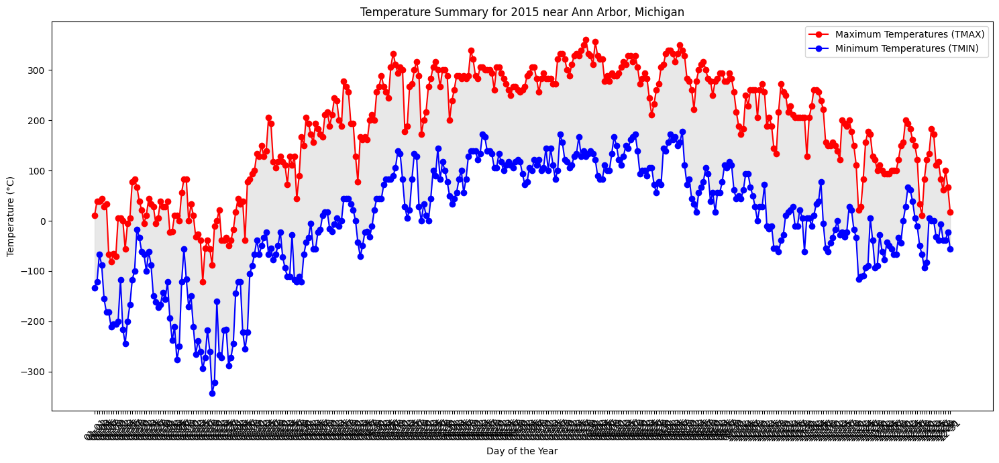

In [41]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the data is already loaded and cleaned in 'temperature_df'

# Filter the data for the year 2015
temperature_2015 = temperature_df[temperature_df['year'] == 2015]

# Extract maximum and minimum temperatures for 2015
tmax_2015 = temperature_2015[temperature_2015['Element'] == 'TMAX'].groupby('day_of_year')['Data_Value'].max()
tmin_2015 = temperature_2015[temperature_2015['Element'] == 'TMIN'].groupby('day_of_year')['Data_Value'].min()

# Create a figure and axis for the plot
plt.figure(figsize=(15, 7))

# Plot maximum temperatures (TMAX) for 2015
plt.plot(tmax_2015.index, tmax_2015.values, label='Maximum Temperatures (TMAX)', color='red', marker='o')

# Plot minimum temperatures (TMIN) for 2015
plt.plot(tmin_2015.index, tmin_2015.values, label='Minimum Temperatures (TMIN)', color='blue', marker='o')

# Shade the area between the maximum and minimum temperatures
plt.fill_between(tmax_2015.index, tmin_2015.values, tmax_2015.values, color='lightgray', alpha=0.5)

# Add labels and title
plt.xlabel('Day of the Year')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Summary for 2015 near Ann Arbor, Michigan')

# Add legend
plt.legend(loc='best')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent clipping
plt.tight_layout()

# Display the plot
plt.show()
